In [1]:
import numpy as np
import pandas as pd
import anndata

from load import *
from factorize import *
from metrics import *
from plot import *

/mnt/home/mavdeeva/zebrafish/lib/python3.8/site-packages/umap/plot.py:203: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.


In [3]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
%matplotlib inline
from sklearn.decomposition import PCA
import umap

# Simulated example

## Prepare data

In [21]:
dat = anndata.read_h5ad('simulated_example/example.h5ad')

In [22]:
# ground truth VB, VC, H
bp = pd.read_csv('simulated_example/batch_pert.csv', index_col = [0,1])
cp = pd.read_csv('simulated_example/condition_pert.csv', index_col = [0,1])
cs_dict = pd.read_csv('simulated_example/cs_dict.csv', index_col = [0,1])

In [23]:
# design matrix
bt_design = dat.obs[['sample', 'batch', 'condition']]
bt_design = bt_design.drop_duplicates().reset_index(drop = True)
bt_design.set_index('sample', inplace = True)
batch_design = bt_design['batch']
cond_design  = bt_design['condition']

In [24]:
# define colors 
batches = bt_design.loc[dat.obs['sample'],:]['batch']
conds = bt_design.loc[dat.obs['sample'],:]['condition']
samps = dat.obs['sample'].values
pal_batch = np.array([[34, 173, 227],[240, 200, 54]])/255
pal_cond = (np.array([[246, 140, 101], [150, 151, 154]])/255)[::-1]
pal_samp = [sns.color_palette('nipy_spectral', as_cmap = True)(x/4) for x in range(4)]
cs_batch = [pal_batch[b] for b in batches]
cs_cond = [pal_cond[c] for c in conds]
cs_samp = [pal_samp[s] for s in samps]

In [25]:
def plot_dat(data):
    pcs = umap.UMAP(n_components=2,n_neighbors=50,
                   min_dist = 0.5, n_jobs = -1).fit_transform(data)
    # shuffle cells for plotting
    rand_cells = list(range(dat.shape[0]))
    np.random.shuffle(rand_cells)
    fig, axes = plt.subplots(1,3,figsize = (15,4), dpi = 600, sharey = True)
    pals = [pal_batch, pal_cond, pal_samp]
    cs_list = [cs_batch, cs_cond, cs_samp]
    keys = ['Batch ', 'Condition ', 'Sample ']
    maps = [batch_design, cond_design, bt_design.index]
    for (i, quad) in enumerate(zip(cs_list, keys, maps, pals)):
        cs, key, map, pal = quad
        ax = axes[i]
        pc_cur = pcs[rand_cells,:]
        c_cur = np.array(cs)[rand_cells]
        ax.scatter(pc_cur[:,0], pc_cur[:,1], 
                   c = c_cur,
                   s = 3)
        patches = []
        for j in np.unique(map):        
            patch = mlines.Line2D([], [], color=pal[j], 
                                  marker = '.', markersize=10, label=key+str(j))
            patches.append(patch)
        ax.legend(handles=patches, handlelength=0)         
    return fig

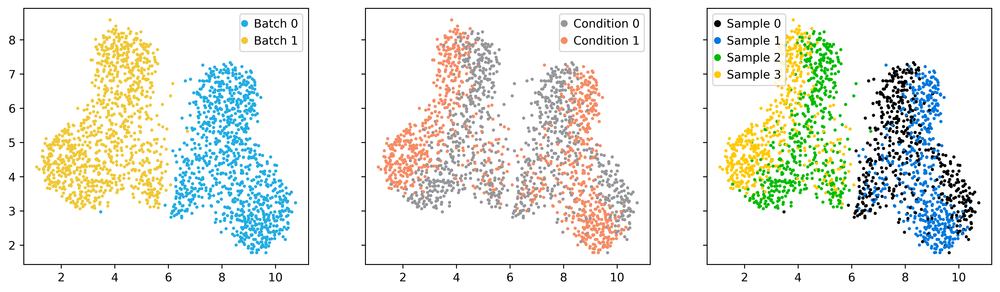

In [26]:
fig = plot_dat(dat.layers['norm'])

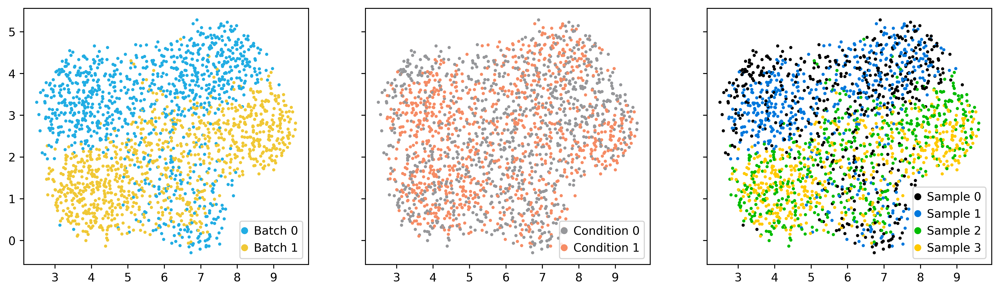

In [27]:
fig1 = plot_dat(dat.layers['scaled_by_sample'])

## Apply DAISEE

In [28]:
daisee_obj = setup_daisee(adata_list = None, 
                 dat = dat,
                 bt_design = bt_design)
val_B = 0.1    
daisee_obj = optimize_ALS_full_des(daisee_obj, 
                                   batch_design = batch_design,
                                   treatment_design = cond_design,
                                   value_lambda_B=val_B,
                                   value_lambda_T=5,
                                   nrep = 3, 
                                   k = 3)


100%|██████████| 30/30 [00:01<00:00, 23.56it/s]


In [29]:
pyliger.quantile_norm(daisee_obj, ref_dataset = 'Batch 0, Stim 0')
H_norm = np.vstack([pd.DataFrame(ada.obsm['H_norm']) for ada in daisee_obj.adata_list])
H_norm = pd.DataFrame(H_norm)
H_norm.index = dat.obs.index
H_norm_DAISEE = H_norm.copy()

## Apply LIGER

In [30]:
adata_list = setup_data_condition(dat = dat, bt_design = bt_design)
liger_obj = setup_liger_condition(adata_list,
                          dat = dat, 
                          bt_design = bt_design)
pyliger.optimize_ALS(liger_obj, k = 3, 
                     #value_lambda=l, 
                     nrep = 3)
pyliger.quantile_norm(liger_obj, 
                      ref_dataset = 'Stim 0')

(1006, 500)
(1006, 500)


100%|██████████| 30/30 [00:00<00:00, 72.44it/s]


In [31]:
ind = np.concatenate([np.where(dat.obs['condition'] == i)[0] for i in range(2)])
adat_copy = dat[ind,:].copy()


In [32]:
pyliger.quantile_norm(liger_obj, ref_dataset = 'Stim 0')
H_norm = np.vstack([pd.DataFrame(ada.obsm['H_norm']) for ada in liger_obj.adata_list])
H_norm = pd.DataFrame(H_norm)
H_norm.index = adat_copy.obs.index#pd.MultiIndex.from_frame(adat_copy.obs)
H_norm_LIGER = H_norm.copy()

## Compare performance

In [33]:
agr = calcAgreement(daisee_obj, 
                    H_norm_DAISEE, 
                    adat_copy, 
              np.unique(dat.obs['sample']),
              ndims=3, 
              k=15, 
              use_aligned=True, 
              rand_seed=42, 
              by_dataset=False)
print('DAISEE agreement: ', agr)

agr = calcAgreement(liger_obj, 
                    H_norm_LIGER, 
                    adat_copy, 
              np.unique(dat.obs['sample']),
              ndims=3, 
              k=15, 
              use_aligned=True, 
              rand_seed=42, 
              by_dataset=False)

print('LIGER agreement: ', agr)


Reducing dimensionality using NMF
DAISEE agreement:  0.45298890631682953
Reducing dimensionality using NMF
LIGER agreement:  0.29156204465848445


In [34]:
ali = np.mean(pd.Series(calcAlignment(daisee_obj, 
                                      H_norm_DAISEE,
                       dat.obs['batch'], 
                      n_jobs = 60,
                      by_cell = True)))

print('DAISEE alignment: ', np.mean(pd.Series(ali)))

ali = np.mean(pd.Series(calcAlignment(liger_obj, 
                                      H_norm_LIGER,
                       adat_copy.obs['batch'], 
                      n_jobs = 60,
                      by_cell = True)))

print('LIGER alignment: ', np.mean(pd.Series(ali)))

DAISEE alignment:  0.9392063492063493
LIGER alignment:  0.9121428571428573


## Plot results

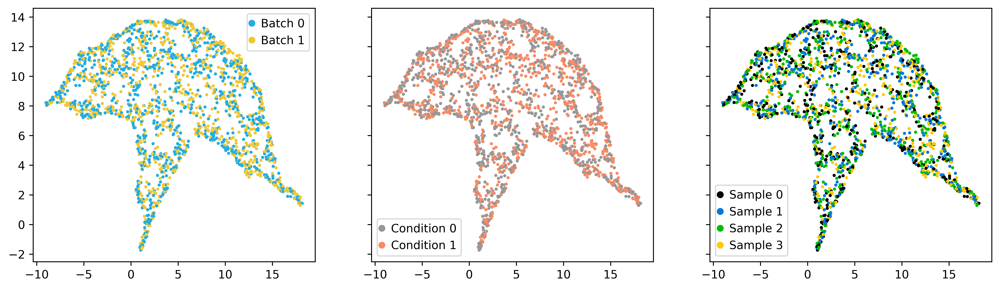

In [35]:
fig = plot_dat(H_norm_DAISEE)

In [36]:
#reorder according to original cell ordering
H_norm_LIGER_reordered = np.zeros(shape = H_norm_LIGER.shape)
H_norm_LIGER_reordered[ind,:] = H_norm_LIGER.copy()
H_norm_LIGER_reordered = pd.DataFrame(H_norm_LIGER_reordered)
H_norm_LIGER_reordered.index = dat.obs.index

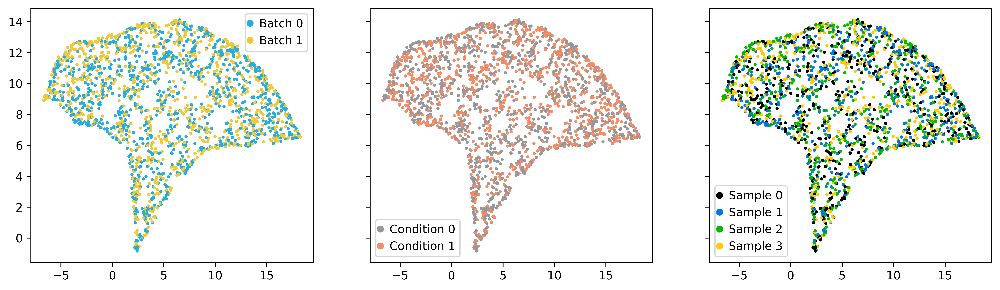

In [37]:
fig1 = plot_dat(H_norm_LIGER_reordered)